In [ ]:
from numba import cuda 
device = cuda.get_current_device()
device.reset()
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 5097622580542643245
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 11320098816
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 383623111665787083
 physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
 xla_global_id: 416903419]

In [2]:
from google.colab import drive
drive.mount("/content/gdrive/")

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [1]:
!pip install segmentation_models
!pip install matplotlib==3.5.1

In [2]:
%env SM_FRAMEWORK=tf.keras
import cv2
import gc
import matplotlib.pyplot as plt
import numpy as np
import segmentation_models as sm
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from segmentation_models.metrics import iou_score
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence
from tensorflow.keras.losses import MeanSquaredError as mse_loss
import tifffile as tiff
import time

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [3]:
dataim=[tiff.imread("../Documents/Microscopie/NDD+interne_3-3_1024-1024_5s_1_0.lsm")]

In [4]:
print(np.shape(dataim))

(1, 5, 4, 3072, 3072)


In [5]:
def untile(im):
    nim=[]
    for i in range(3):
        for j in range(3):
            nim.append(im[:,:,(j)*1024:(j+1)*1024,(i)*1024:(i+1)*1024])
    return nim

def selmax(im):
    nim=np.zeros((9,4,1024,1024))
    num=0
    for i in im:
        nim[num]=i[0]
        for j in i:
            if np.mean(j[0])>np.mean(nim[num][0]):
                nim[num]=j
        num+=1
    return np.transpose(nim,(0,2,3,1))
imgs=None
for im in dataim:
    im2=untile(im)
    im3=selmax(im2)
    if imgs is None:
        imgs=im3
    else:imgs=np.concatenate((imgs,im3),axis=0)

In [6]:
imshape=np.shape(np.expand_dims(imgs[0,:,:,0],axis=-1))
nddr=np.expand_dims(imgs[...,0],axis=3)
nddg=np.expand_dims(imgs[...,1],axis=3)
intg=np.expand_dims(imgs[...,2],axis=3)
intr=np.expand_dims(imgs[...,3],axis=3)
x_train=np.concatenate((intg,intr),axis=0)
y_train=np.concatenate((nddg,nddr),axis=0)
x_train=np.concatenate((x_train,x_train,x_train),axis=3)
index=np.random.permutation(len(x_train))
x_train=x_train[index]
y_train=y_train[index]
sep=int((3/4)*len(x_train))
x_train,x_valid,y_train,y_valid=x_train[:sep],x_train[sep:],y_train[:sep],y_train[sep:]
del imgs,nddr,nddg,intg,intr
gc.collect()

95

In [7]:
print(np.shape(x_train),np.shape(y_train))

(13, 1024, 1024, 3) (13, 1024, 1024, 1)


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

class Tile:
    '''
    Usage    : Tile(image,tilesize,overlap,verbose)
    image    : Array of shape [length,width,canals]
    tilesize : The output will be of shape [tilesize,tilesize,canals]
    overlap  : Amount of pixel common between two consecutive tiles
    ================================================================
    Methods  :
    padding(mode="reflect"): Returns a padded image via numpy.pad usage
    tilegeneration()       : Returns a list parts of original image(tiles)
    tilevis(concat=True)   : Plots the tiles list for the image
    detmask()              : Returns the mask of overlapping areas
    reconstruct()          : Builds the image back out of the tile list   
    '''
    
    def __init__(self, image, tilesize=None,overlap=None,verbose=False):
        
        self.im = image
        self.s  = np.shape(self.im)[:2]
        if tilesize is None:tilesize=self.s[0]//4
        self.t  = tilesize
        if overlap is None :overlap =tilesize//4
        self.o  = overlap
        self.verbose=verbose
        self.verdata()
        self.to = self.t-self.o
        self.nbt= [(self.s[0]-self.o)//self.to+1,(self.s[1]-self.o)//self.to+1]
        self.p  = None
        self.pIm= None
        self.tl = None
        
    def verdata(self):
        if (np.shape(self.im)[0]%2)!=0:
            if self.verbose:print("Changing image to an even dimension value, one pixel was removed on axis zero.")
            self.im=self.im[:-1]
        if (np.shape(self.im)[1]%2)!=0:
            if self.verbose:print("Changing image to an even dimension value, one pixel was removed on axis one.")
            self.im=self.im[:,:-1]
        if self.o%2!=0:
            if self.verbose:print("Please use even value for overlap, overlap was reduced by one.")
            self.o-=1
        if self.t>np.shape(self.im)[0] or self.t>np.shape(self.im)[1]:
            if self.verbose:print("You probably didn't do what you want, you will just have one padded image. (Tile size larger than image)")
                      
    def detpad(self):
        psize=[(self.nbt[0]*self.to+self.o)-self.s[0],(self.nbt[1]*self.to+self.o)-self.s[1]]
        for i in range(len(psize)):
            if  psize[i]==self.to:
                psize[i]%=self.to
                self.nbt[i]-=1
        return psize
    
    def padding(self,mode="reflect"):
        if self.p is None:
            self.p=self.detpad()
        padval=int(self.p[0]/2),int(self.p[1]/2)
        print(np.shape(self.im))
        pIm=np.pad(self.im,((padval[0],padval[0]),(padval[1],padval[1]),(0,0)),mode=mode)
        return pIm
    
    def tilegeneration(self):
        if self.pIm is None:
            self.pIm=self.padding()
        tiles=[]
        for i in range (self.nbt[0]):
            for j in range (self.nbt[1]):
                tiles.append(self.pIm[i*self.to:i*self.to+self.t,j*self.to:j*self.to+self.t])
        return tiles
    
    def tilevis(self,concat=True):
        if self.tl is None:
            self.tl=self.tilegeneration()
        plt.figure(figsize =( 3*self.nbt[1], 3*self.nbt[0]))
        if not concat:
            for i in range(self.nbt[0]):
                for j in range(self.nbt[1]):
                    ax = plt.subplot(self.nbt[0], self.nbt[1], i*self.nbt[1]+j+1)
                    ax.axis("off")
                    plt.imshow(self.tl[i*self.nbt[1]+j])
        else:
            im=[]
            for i in range(self.nbt[0]):
                line=[]
                for j in range(self.nbt[1]):
                    if j==0: line=self.tl[i*self.nbt[1]+j]
                    else: line = np.concatenate((line,self.tl[i*self.nbt[1]+j]),axis=1)
                if i==0:im=line
                else:im=np.concatenate((im,line),axis=0)
            plt.imshow(im[...,0])
        plt.show()
        
    
    def detmask(self):
        if self.pIm is None:
            self.pIm=self.padding()
        mask=np.zeros(np.shape(self.pIm)[:2])
        for i in range (self.nbt[0]):
            for j in range (self.nbt[1]):
                mask[i*self.to:i*self.to+self.t,j*self.to:j*self.to+self.t]+=np.ones((self.t,self.t))
        return mask[int(self.p[0]/2):self.s[0]+int(self.p[0]/2),int(self.p[1]/2):self.s[1]+int(self.p[1]/2)]
    
    def reconstruct(self,tl=None):
        if tl is None:
            tl=self.tilegeneration()
        reim=np.zeros(np.shape(self.pIm))
        lb=int(self.o/2)
        rb=self.t-lb
        for i in range (self.nbt[0]):
            for j in range (self.nbt[1]):
                reim[i*self.to+lb:i*self.to+rb,j*self.to+lb:j*self.to+rb]+=tl[i*self.nbt[1]+j][lb:rb,lb:rb]
        reim=reim[int(self.p[0]/2):self.s[0]+int(self.p[0]/2),int(self.p[1]/2):self.s[1]+int(self.p[1]/2)]
        if np.max(reim)<=1:
          reim=(reim*255)
        return reim.astype("uint8")


In [9]:
def tiling(dataset,tilesize=256,overlap=128):
    
    tiled=[]
    for i in dataset:
        tempi=Tile(i,tilesize,overlap)
        tiled.append(tempi.tilegeneration())
    tempi.tilevis()
    del tempi
    gc.collect()
    return np.reshape(tiled,(-1,tilesize,tilesize,np.shape(dataset)[-1]))

(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)


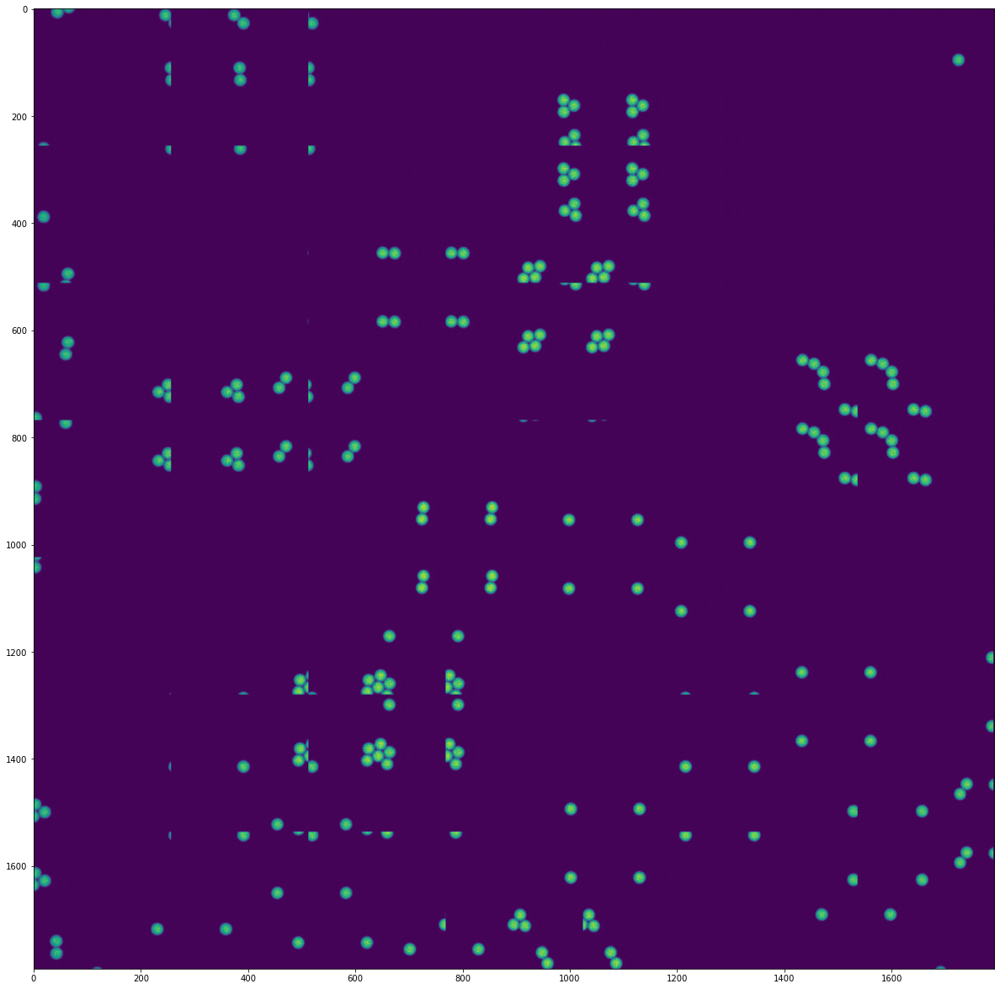

(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)


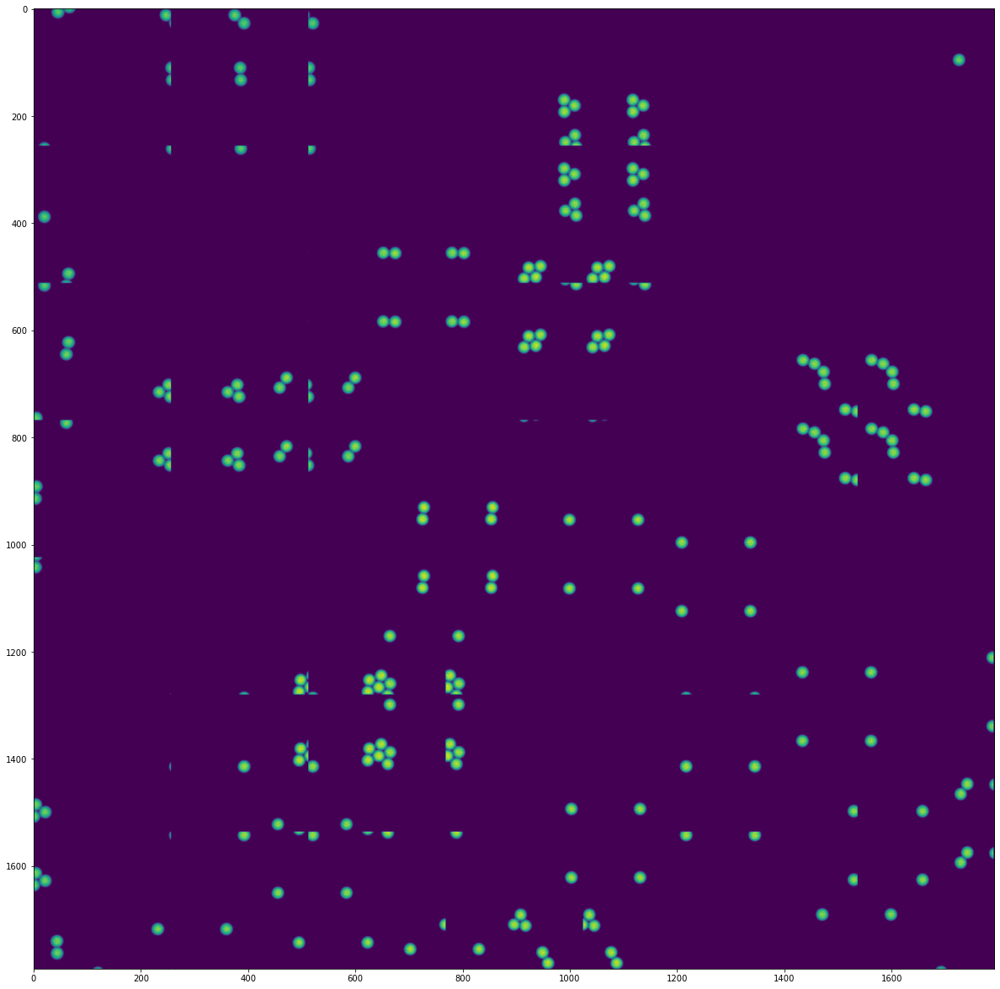

(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)


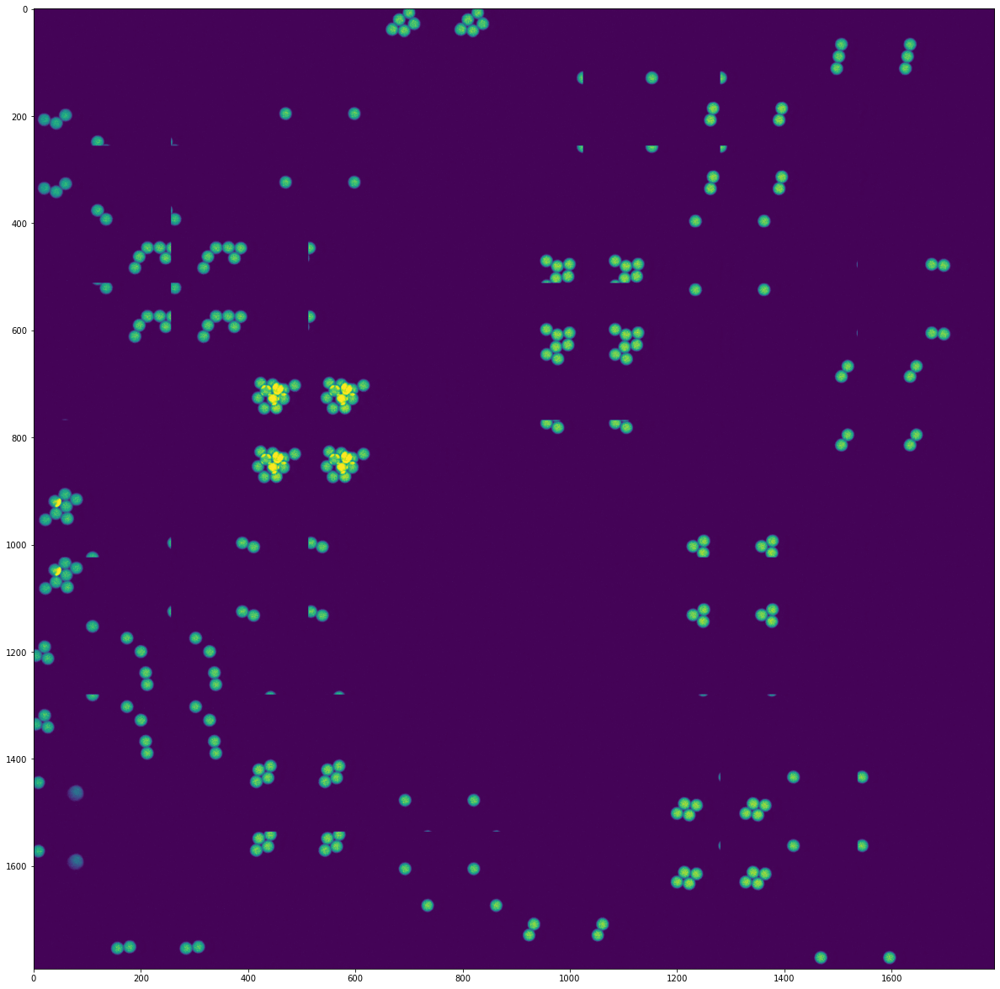

(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)
(1024, 1024, 1)


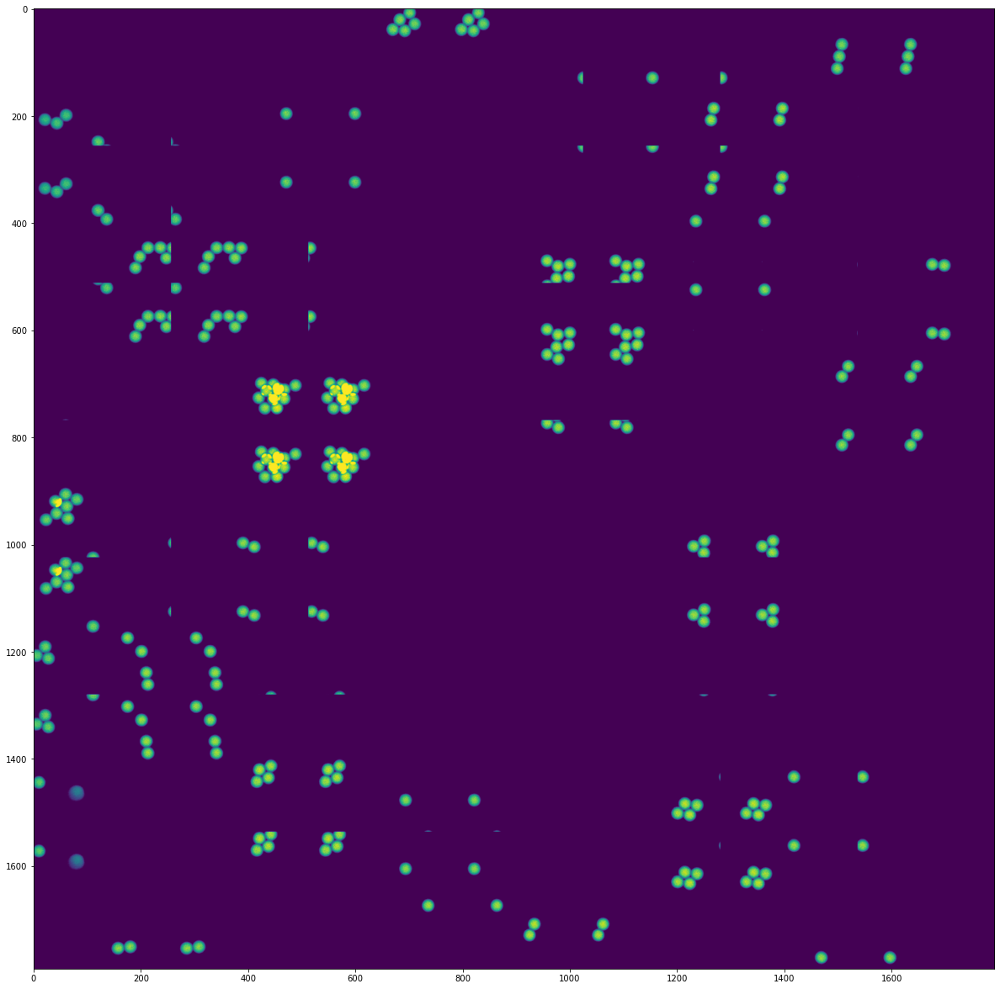

In [10]:
def tiling(dataset,tilesize=256,overlap=128):
    
    tiled=[]
    for i in dataset:
        tempi=Tile(i,tilesize,overlap)
        tiled.append(tempi.tilegeneration())
    tempi.tilevis()
    del tempi
    gc.collect()
    return np.reshape(tiled,(-1,tilesize,tilesize,np.shape(dataset)[-1]))
tilesize=256
overlap=128
x_train,y_train=tiling(x_train),tiling(y_train)
x_valid,y_valid=tiling(x_valid),tiling(y_valid)

In [11]:
def mse(y_true, y_pred):
  mse = mse_loss()
  return mse(y_true, y_pred)

model = Unet("efficientnetb0",encoder_weights="imagenet",activation="linear", input_shape=(None, None, 3),classes=1)
model.compile(Adam(learning_rate=1e-3), loss=mse)
checkpoint_filepath = '/tmp/checkpoint'

es_callback=tf.keras.callbacks.EarlyStopping(
    monitor="loss",
    min_delta=0,
    patience=10,
    verbose=0,
    mode="min",
    baseline=None,
    restore_best_weights=True,
)

In [12]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [13]:
if False:
  if np.max(x_train)>1:x_train=(x_train.astype("float32"))/255
  if np.max(y_train)>1:y_train=(y_train.astype("float32"))/255
  print(x_train.dtype,y_train.dtype)
  print(np.max(x_train),np.max(y_train))
  print(np.shape(x_train),np.shape(y_train))
if True:
  x_train=sm.get_preprocessing("efficientnetb0")(x_train)
  y_train=(y_train.astype("float32"))
  x_valid=sm.get_preprocessing("efficientnetb0")(x_valid)
  y_valid=(y_valid.astype("float32"))

In [14]:
  print(x_train.dtype,y_train.dtype)
  print(np.max(x_train),np.max(y_train))
  print(np.shape(x_train),np.shape(y_train))

float64 float32
2.6399999999999997 255.0
(637, 256, 256, 3) (637, 256, 256, 1)


In [15]:
  print(x_valid.dtype,y_valid.dtype)
  print(np.max(x_valid),np.max(y_valid))
  print(np.shape(x_valid),np.shape(y_valid))

float64 float32
2.6399999999999997 255.0
(245, 256, 256, 3) (245, 256, 256, 1)


In [ ]:
# Fit the model on the batches generated by datagen.flow().
model.compile(Adam(learning_rate=1e-4), loss=mse)
history1 = model.fit(
    x=x_train,
    y=y_train,
    epochs=100,
    batch_size=24,
    workers=2, use_multiprocessing=False,
    validation_data=[x_valid,y_valid],
    callbacks=[es_callback])

Epoch 1/100
27/27 [==============================] - 50s 1s/step - loss: 15.2147 - val_loss: 56642.5312
Epoch 2/100
27/27 [==============================] - 37s 1s/step - loss: 14.2117 - val_loss: 52228.7461
Epoch 3/100
27/27 [==============================] - 37s 1s/step - loss: 13.9607 - val_loss: 58789.9023
Epoch 4/100
27/27 [==============================] - 37s 1s/step - loss: 13.2292 - val_loss: 63921.0625
Epoch 5/100
27/27 [==============================] - 37s 1s/step - loss: 13.9129 - val_loss: 63932.8906
Epoch 6/100
27/27 [==============================] - 37s 1s/step - loss: 13.8477 - val_loss: 69060.0469
Epoch 7/100
27/27 [==============================] - 37s 1s/step - loss: 16.4634 - val_loss: 78874.5078
Epoch 8/100
27/27 [==============================] - 37s 1s/step - loss: 13.7973 - val_loss: 75142.8828
Epoch 9/100
27/27 [==============================] - 37s 1s/step - loss: 15.2090 - val_loss: 75586.8516
Epoch 10/100
27/27 [==============================] - 37s 1s/ste

In [99]:
model.evaluate(x_train,y_train)
model.evaluate(x_valid,y_valid)

8/8 [==============================] - 3s 424ms/step - loss: 13.6740


13.673983573913574

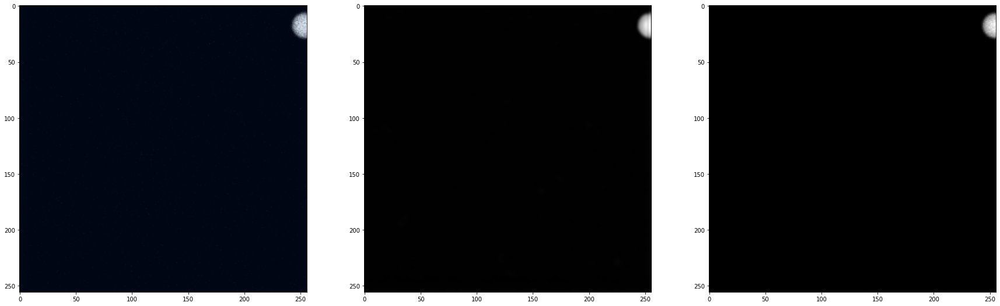

0.039160165414898 0.003008707 0.00244757
0.050566280333434854 0.04142625 0.03792553695977903


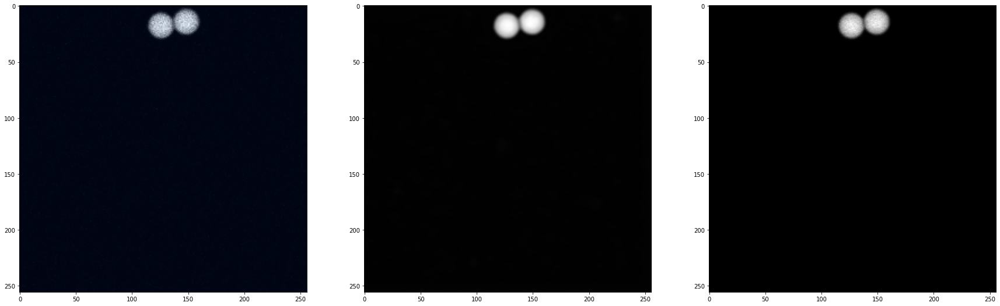

0.0436487486345658 0.010236959 0.008184934
0.07640816851678921 0.08551907 0.07112424513872932


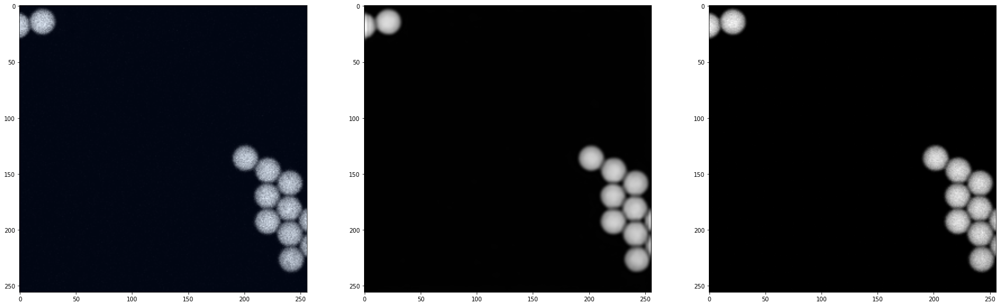

0.07285996823789874 0.038387775 0.036677044
0.13962215979147055 0.1493186 0.14357744104721967


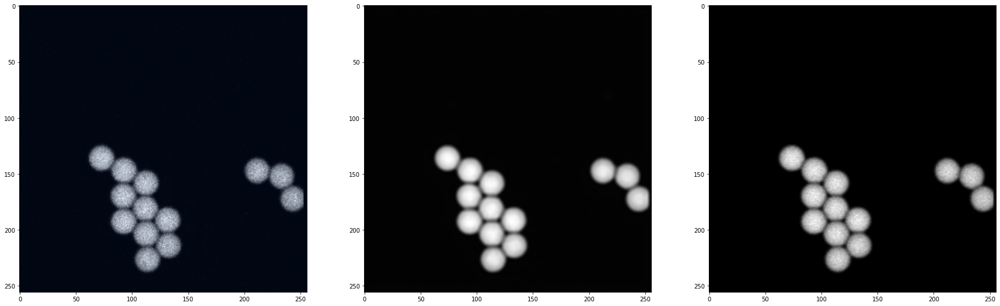

0.08178474389557679 0.059402116 0.046371043
0.1522961692101361 0.20040208 0.15779027003867954


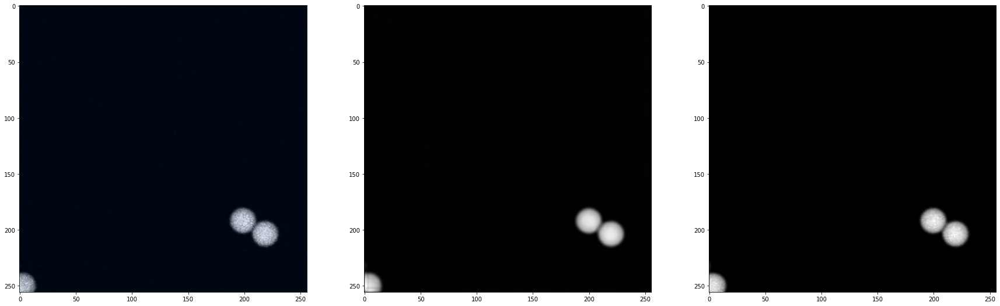

0.043996244795421476 0.011849593 0.011159979
0.08123481602458499 0.08860003 0.08582400153664982


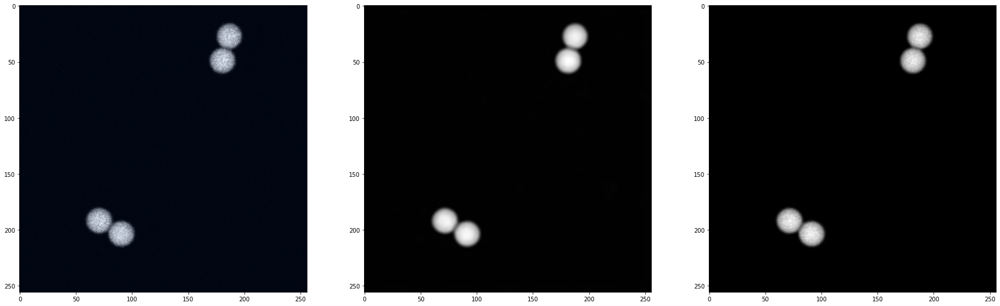

0.0491193831346548 0.019153133 0.016830623
0.09847636118507622 0.11628357 0.1045137741986443


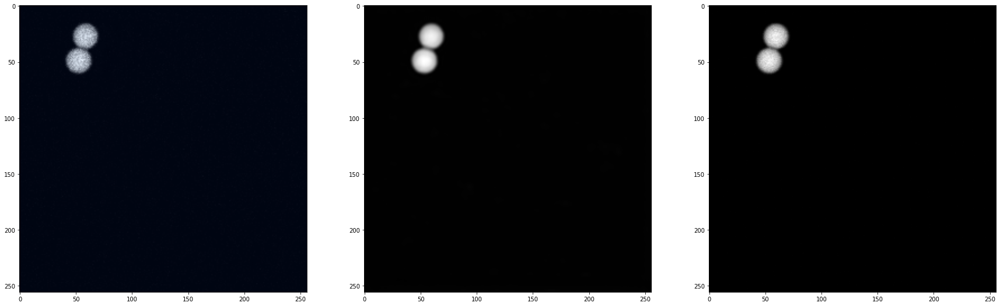

0.041611310965680944 0.00977857 0.008320169
0.0726681233795481 0.08232329 0.07300211588541666


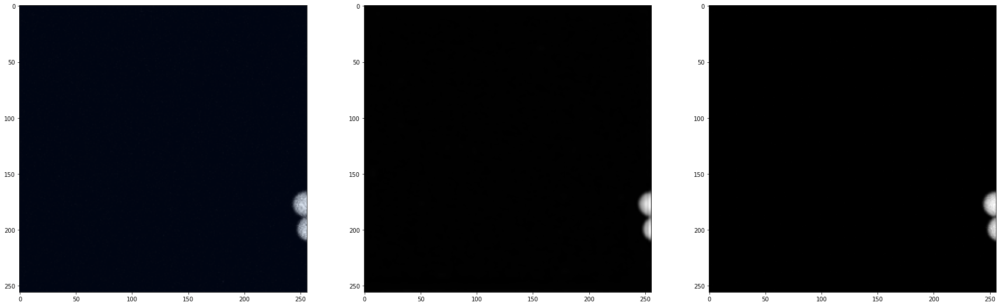

0.03797886296865541 0.0038883977 0.0033704573
0.05354874401321549 0.04716336 0.043843740575453816


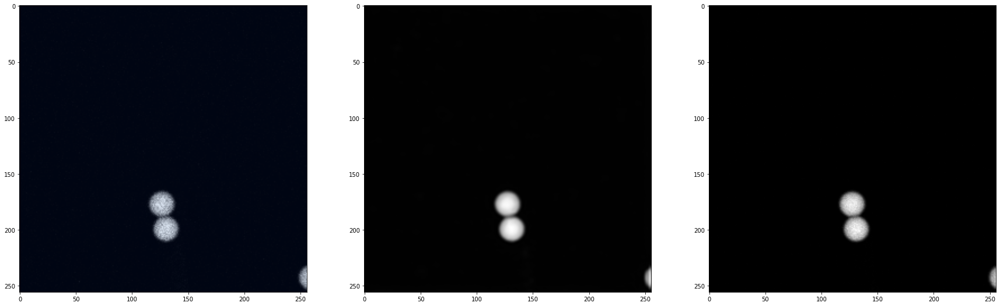

0.042815115496659666 0.010584567 0.008592254
0.07508774410507943 0.08488185 0.07146408230650658


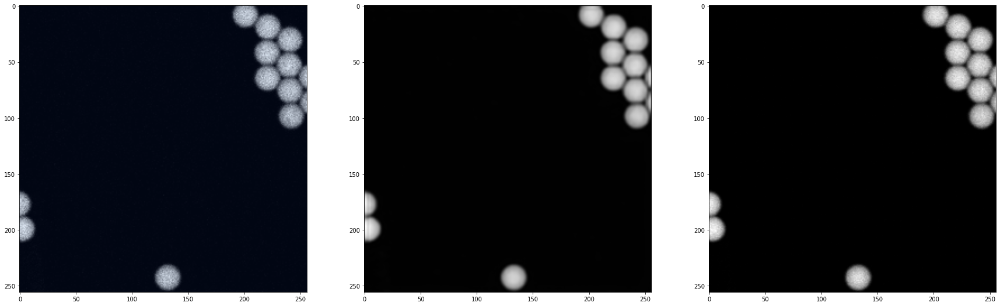

0.07476146662769338 0.042211533 0.03878168
0.14261362175899994 0.15896378 0.14715130375880822


In [ ]:
for i in range(10,20):
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(30,30))
  nval=(x_valid[i]-np.min(x_valid[i]))/np.max(x_valid[i]-np.min(x_valid[i]))
  ax1.imshow(nval,cmap="gray")
  pred=model.predict(np.expand_dims(x_valid[i],axis=0)).squeeze()
  ax2.imshow((pred)/np.max(pred),cmap="gray")
  ax3.imshow(y_valid[i],cmap="gray")
  plt.show()
  print(np.mean(nval),np.mean(pred/np.max(pred)),np.mean(y_valid[i]/255))
  print(np.std(nval),np.std(pred/np.max(pred)),np.std(y_valid[i])/255)
  

In [91]:
res=model.predict(x_valid,batch_size=48)

In [83]:
tinfo=Tile(np.zeros(imshape),tilesize,overlap)
xtrec=[]
tinfo.pIm=tinfo.padding()
nim=tinfo.nbt[0]*tinfo.nbt[1]
for i in range(len(res)//nim):
    xtrec.append(tinfo.reconstruct(res[nim*i:nim*(i+1)]))
print(np.shape(xtrec))
print(np.max(xtrec))

(100, 1024, 1024, 1)
294


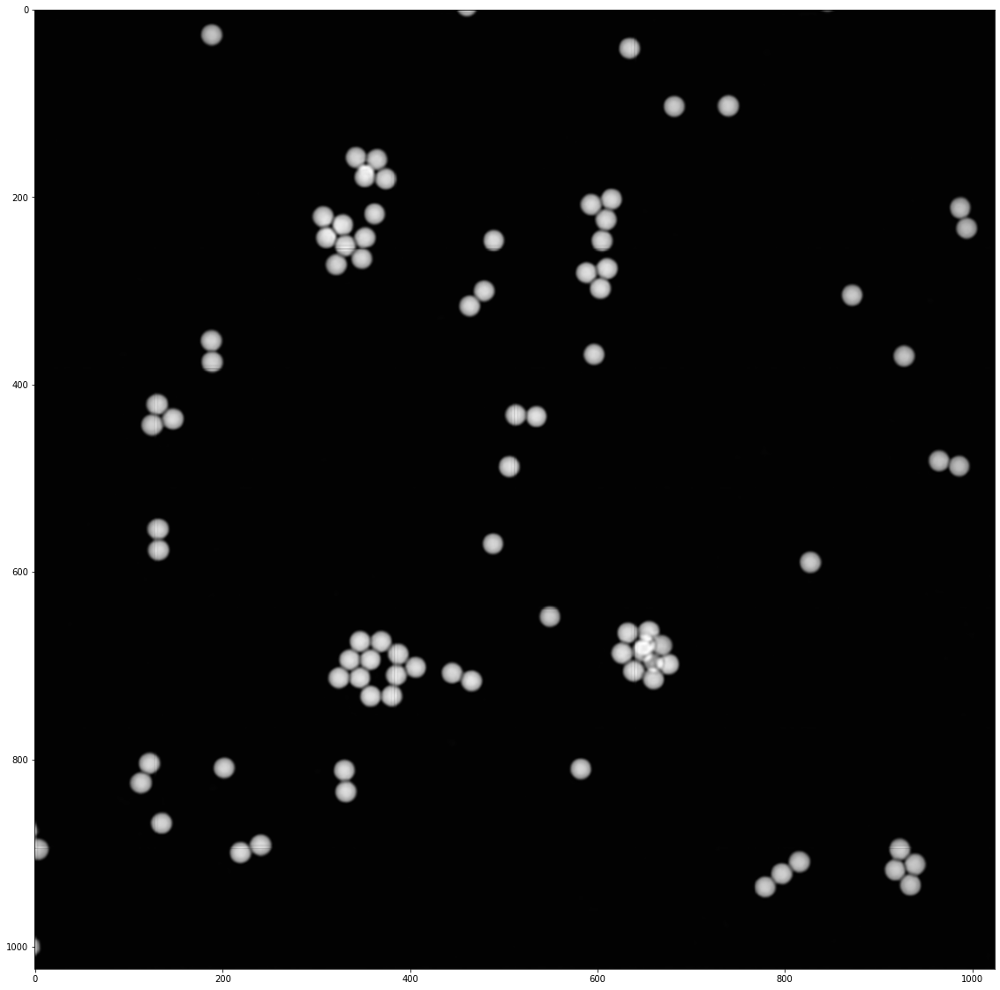

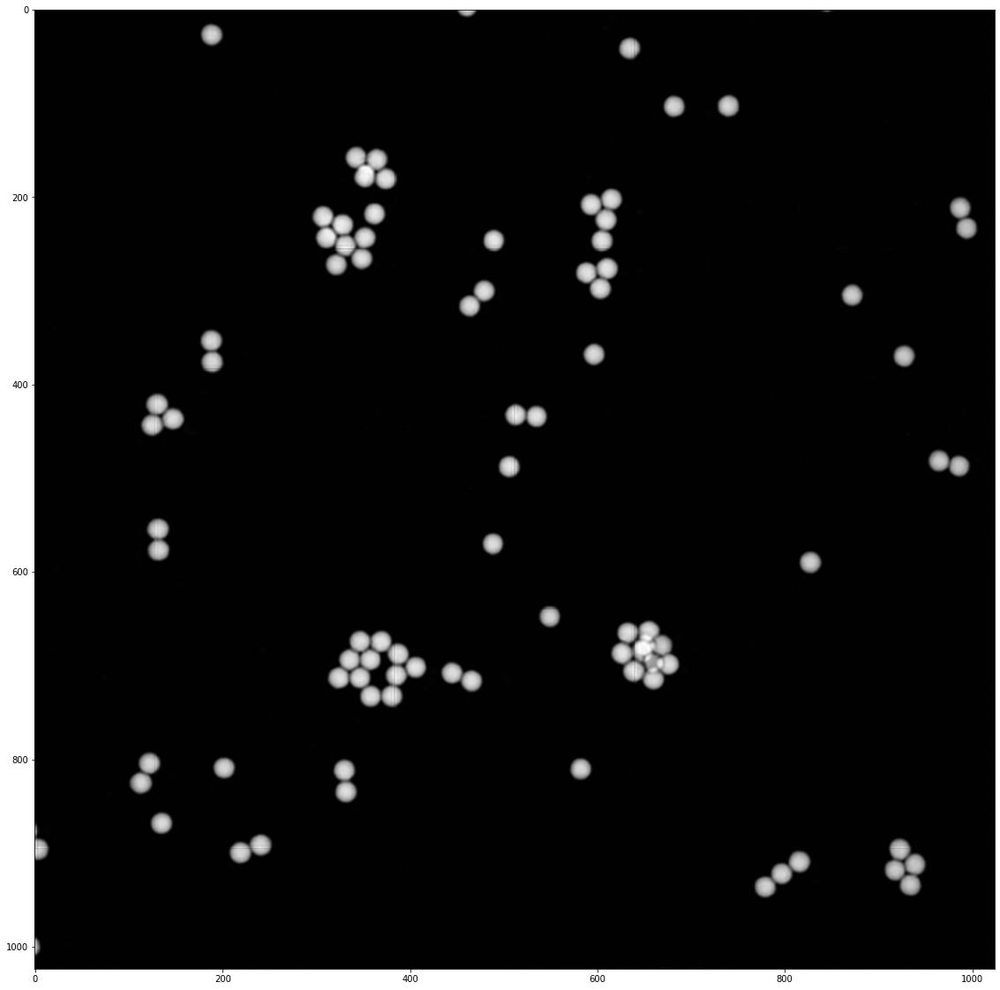

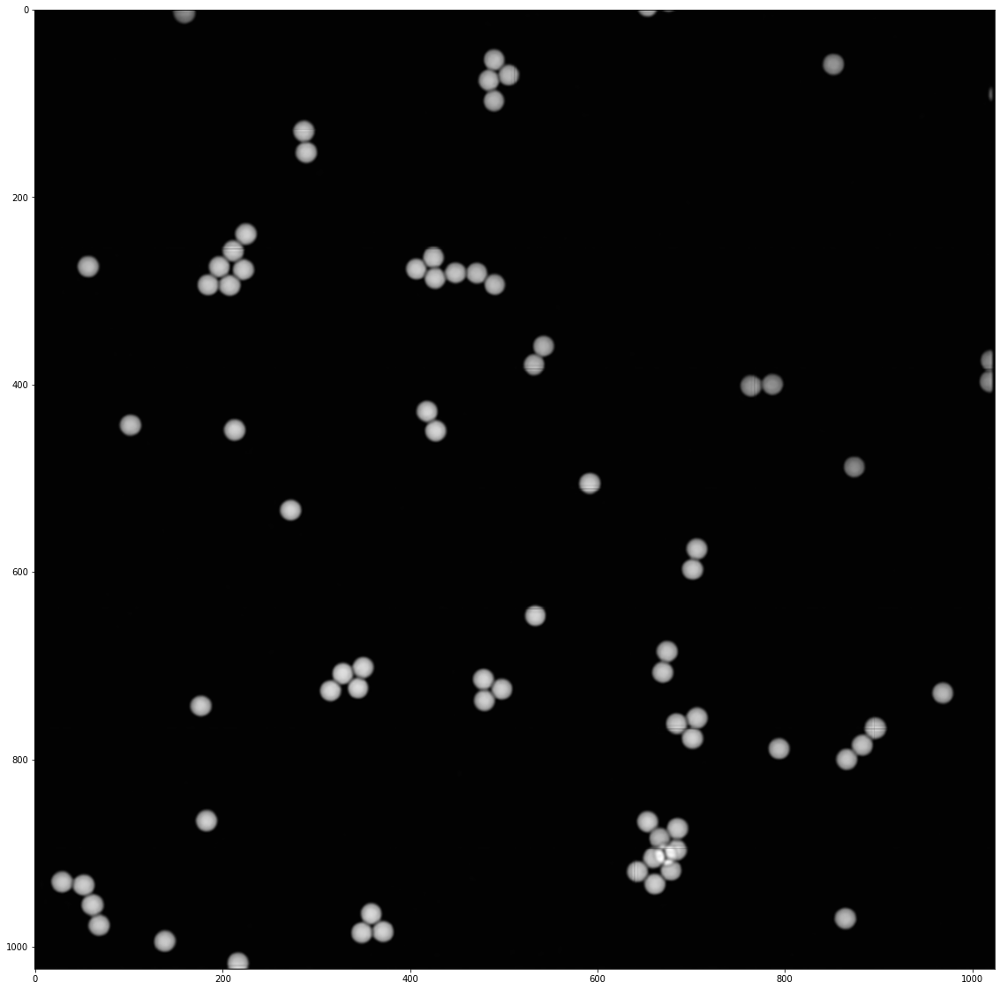

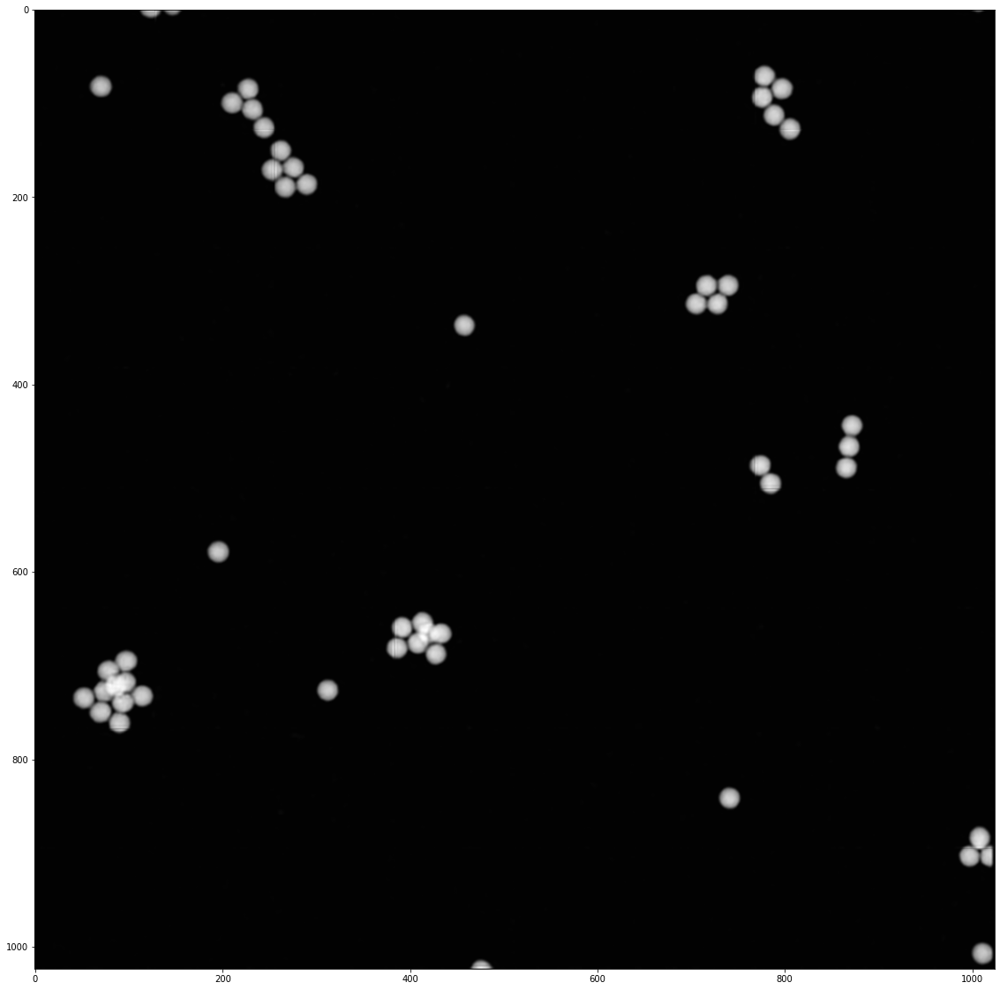

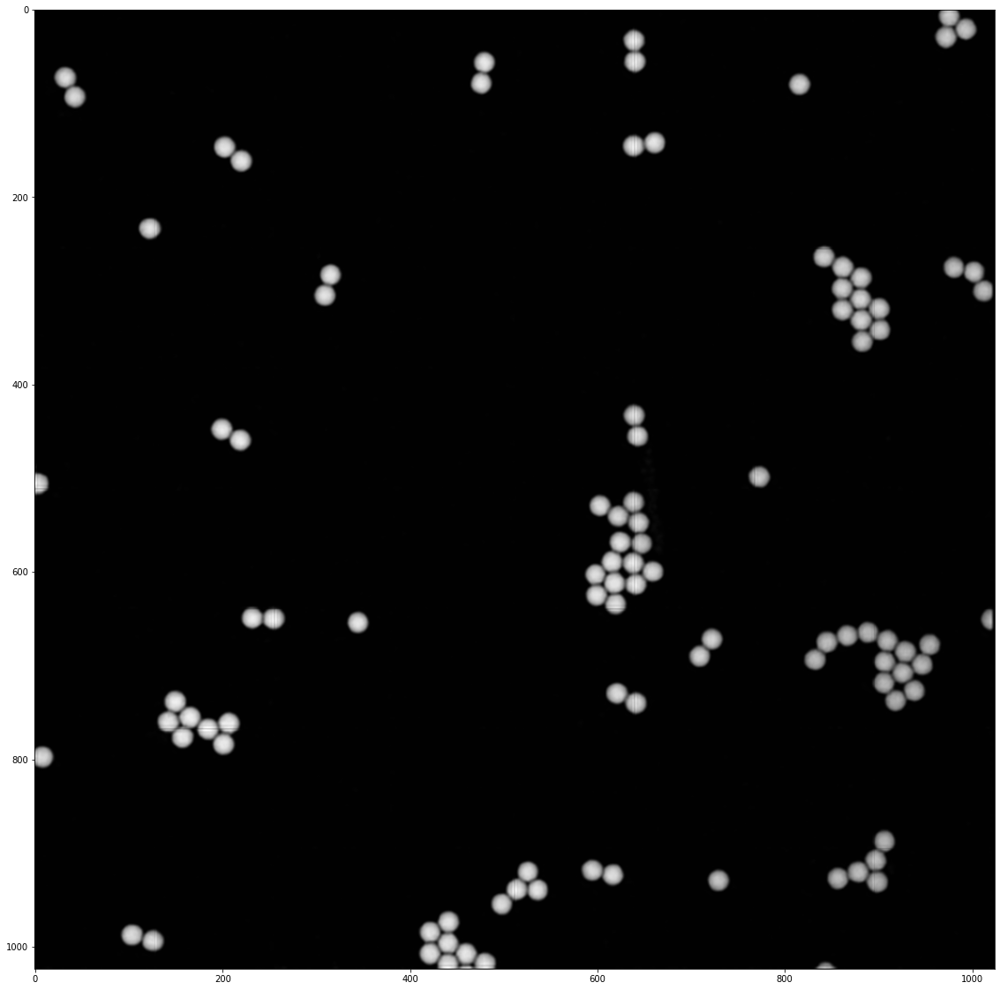

In [102]:
for i in xtrec:
  plt.figure(figsize=(20,20))
  plt.imshow(i,cmap="gray")
plt.show()

In [26]:
ims=[tiff.imread("../Documents/Microscopie/5-5_1024-1024_5s_0_0.lsm"),
     tiff.imread("../Documents/Microscopie/NDD_5-5_1024-1024_5s_0_0.lsm"),
     tiff.imread("../Documents/Microscopie/interne_5-5_1024-1024_5s_1_1.lsm"),
     tiff.imread("../Documents/Microscopie/NDD_5-5_1024-1024_5s_1_1.lsm")]

def untile(im):
    nim=[]
    for i in range(3):
        for j in range(3):
            nim.append(im[:,:,(j)*1024:(j+1)*1024,(i)*1024:(i+1)*1024])
    return nim

def selmax(im):
    nim=np.zeros((25,2,1024,1024))
    num=0
    for i in im:
        nim[num]=i[0]
        for j in i:
            if np.mean(j[0])>np.mean(nim[num][0]):
                nim[num]=j
        num+=1
    return np.transpose(nim,(0,2,3,1))

imgs=None
for im in ims:
    im2=untile(im)
    im3=selmax(im2)
    if imgs is None:
        imgs=im3
    else:imgs=np.concatenate((imgs,im3),axis=0)
img0=np.expand_dims(imgs[...,0],axis=3)
img1=np.expand_dims(imgs[...,1],axis=3)
del imgs
gc.collect()
imgs=np.concatenate((img0,img1),axis=0)
del img0,img1
gc.collect()
print(imgs.shape)

(200, 1024, 1024, 1)


In [27]:
nddr=np.concatenate((imgs[50:75],imgs[150:175]),axis=0)
nddg=np.concatenate((imgs[75:100],imgs[175:200]),axis=0)
intg=np.concatenate((imgs[0:25],imgs[100:125]),axis=0)
intr=np.concatenate((imgs[25:50],imgs[125:150]),axis=0)

In [28]:
del ims,imgs
gc.collect()

0

In [29]:
x_test=np.concatenate((intg,intr),axis=0)
y_test=np.concatenate((nddg,nddr),axis=0)
x_test=np.concatenate((x_test,x_test,x_test),axis=3)
tilesize=256
overlap=128

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


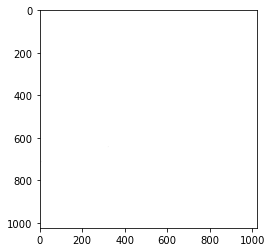

In [30]:
plt.imshow(x_test[0])

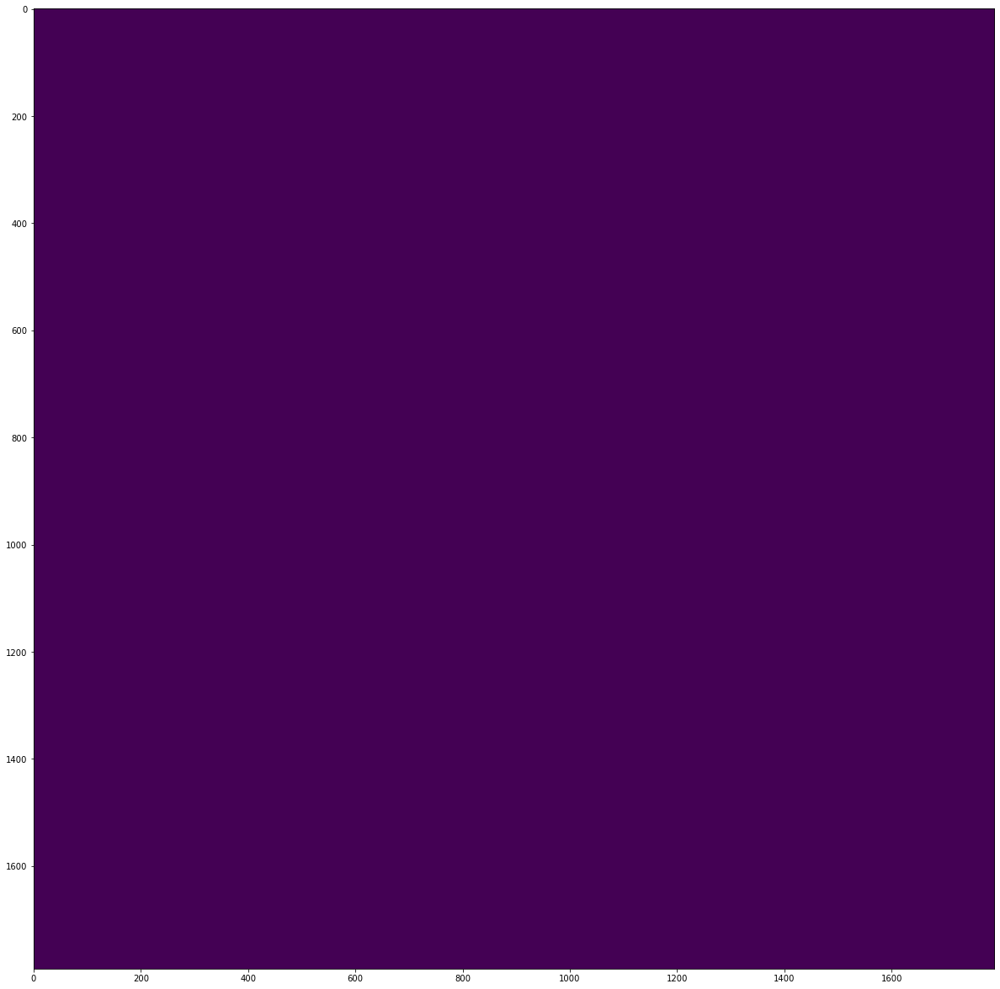

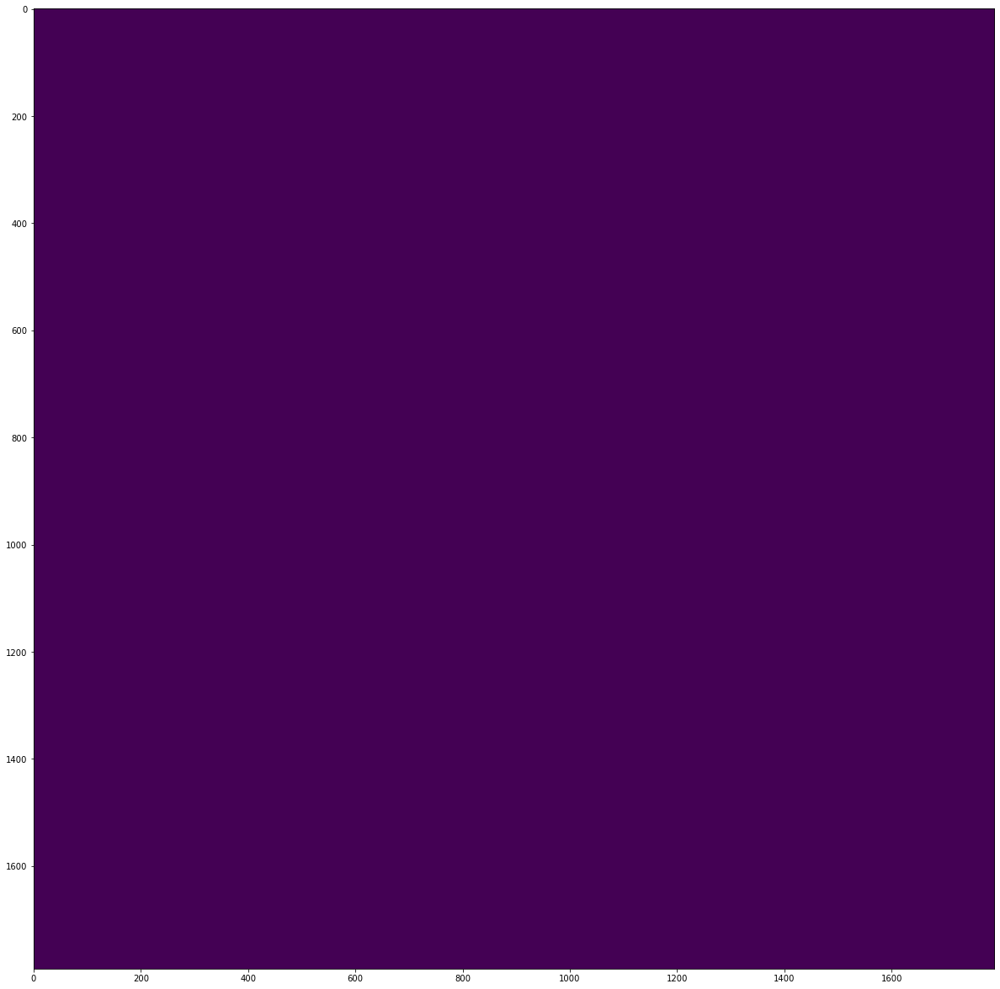

In [12]:
del(intg,intr,nddg,nddr)
gc.collect()
x_test,y_test=tiling(x_test),tiling(y_test)
if True:
  x_test=sm.get_preprocessing("efficientnetb0")(x_test)
  y_test=(y_test.astype("float32"))

In [25]:
im=tiff.imread("02_20x_MolProbes-ReinsSouris-NLO900Interne.lsm")
print(np.shape(im))

(2, 1024, 1024)


In [26]:
print(np.max(res))

168.70482


In [27]:
im=np.expand_dims(im,axis=-1)
im=np.concatenate((im,im,im),axis=3)
print(np.shape(im))

(2, 1024, 1024, 3)


(1024, 1024, 3)


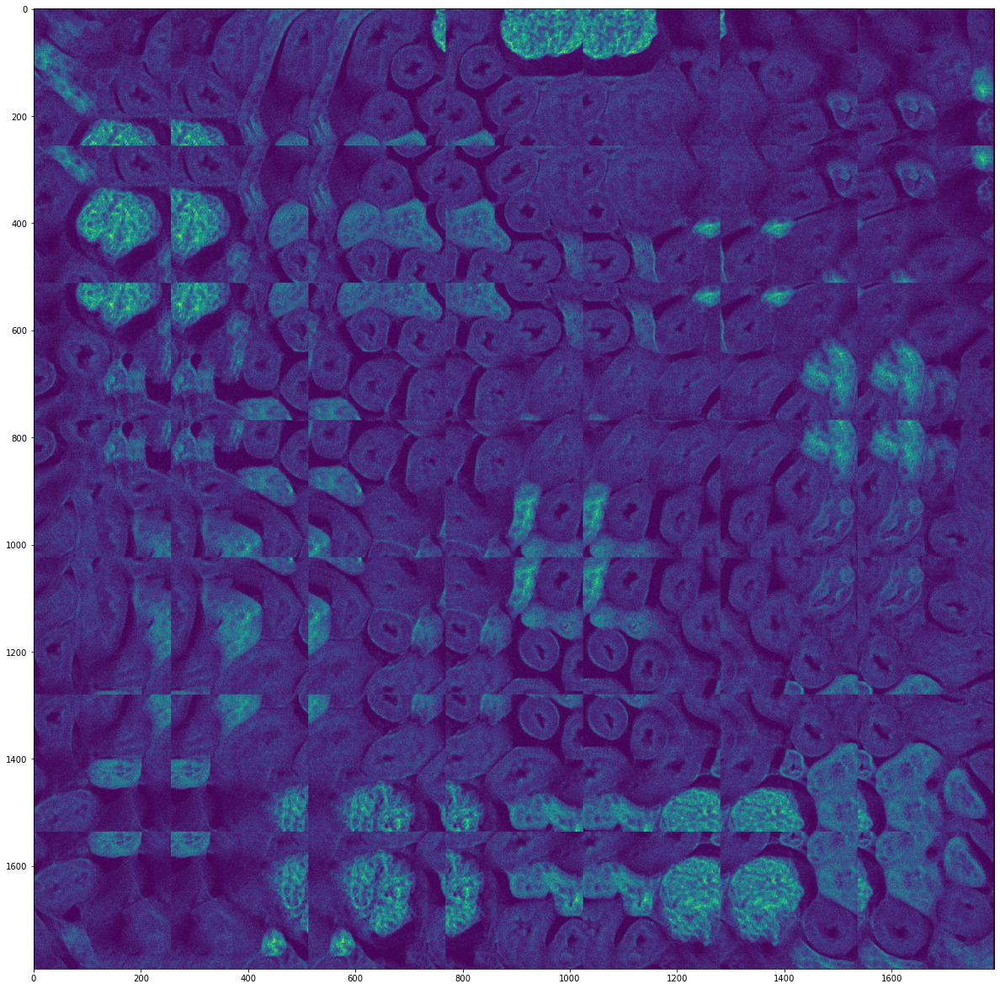

(1024, 1024, 3)


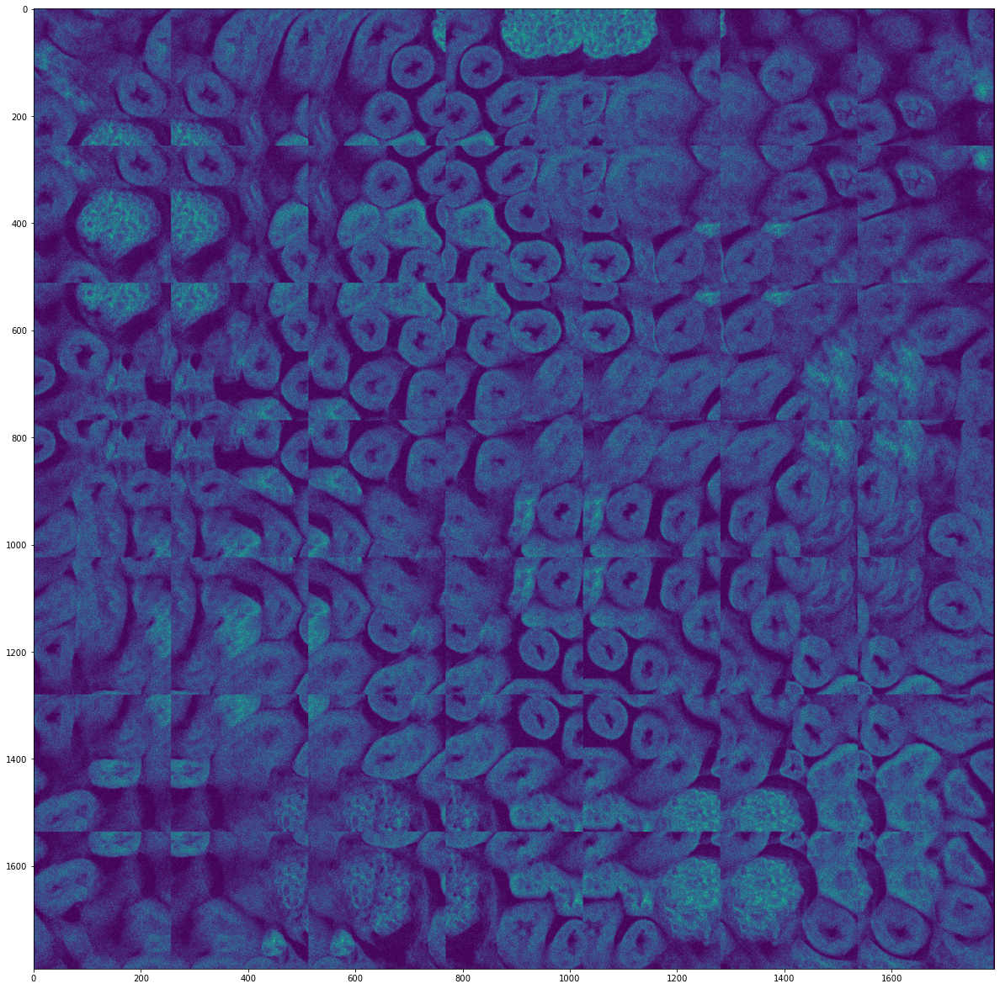

In [28]:
new_im=[]
for i in im:
    new_im.append(tiling(np.expand_dims(i,axis=0)).astype("float32"))
new_im=np.reshape(new_im,(98,256,256,3))
im=new_im

In [29]:
im=sm.get_preprocessing("efficientnetb5")(im)

In [30]:
res=model.predict(im,batch_size=64)

In [31]:
print(np.shape(im))

(98, 256, 256, 3)


In [32]:
tinfo=Tile(np.zeros((1024,1024,1)),tilesize,overlap)
imxtrec=[]
tinfo.pIm=tinfo.padding()
nim=tinfo.nbt[0]*tinfo.nbt[1]
for i in range(len(res)//nim):
    imxtrec.append(tinfo.reconstruct(res[nim*i:nim*(i+1)]))
print(np.shape(imxtrec))
print(np.max(imxtrec))

(1024, 1024, 1)
(2, 1024, 1024, 1)
185


In [141]:
im=tiff.imread("Result of 02_20x_MolProbes-ReinsSouris-NLO900Interne.tif")
print(np.mean(imxtrec[0]))
print(np.min(imxtrec[0]))
print(np.mean(im[0]))
print(np.min(im[0]))
print(np.mean(imxtrec[1]))
print(np.min(imxtrec[1]))
print(np.mean(im[1]))
print(np.min(im[1]))

4.85434627532959
-2
1.6133136749267578
0
4.400617599487305
-2
1.1646833419799805
0


In [125]:
print(np.shape(res))

(49, 256, 256, 1)


In [28]:
res=model.predict(x_test,batch_size=48)

NameError: name 'x_test' is not defined

In [75]:
print(np.shape(res[0]))
repred=[]
for i in res[:49]:
    repred.append(i)

(256, 256, 1)


In [76]:
repred=np.concatenate((repred,repred,repred),axis=3)
repred=sm.get_preprocessing("efficientnetb0")(repred)


In [71]:
print(np.shape(reres[0:25]))

(25, 256, 256, 1)


In [68]:
print(tinfo.nbt)

[7, 7]


In [77]:
reres=model.predict(repred)

In [81]:
tinfo=Tile(np.zeros(imshape),tilesize,overlap)
rextrec=[]
tinfo.pIm=tinfo.padding()
nim=tinfo.nbt[0]*tinfo.nbt[1]
for i in range(len(reres)//nim):
    rextrec.append(tinfo.reconstruct(reres[nim*i:nim*(i+1)]))
print(np.shape(rextrec))
print(np.max(rextrec))

(1, 1024, 1024, 1)
224


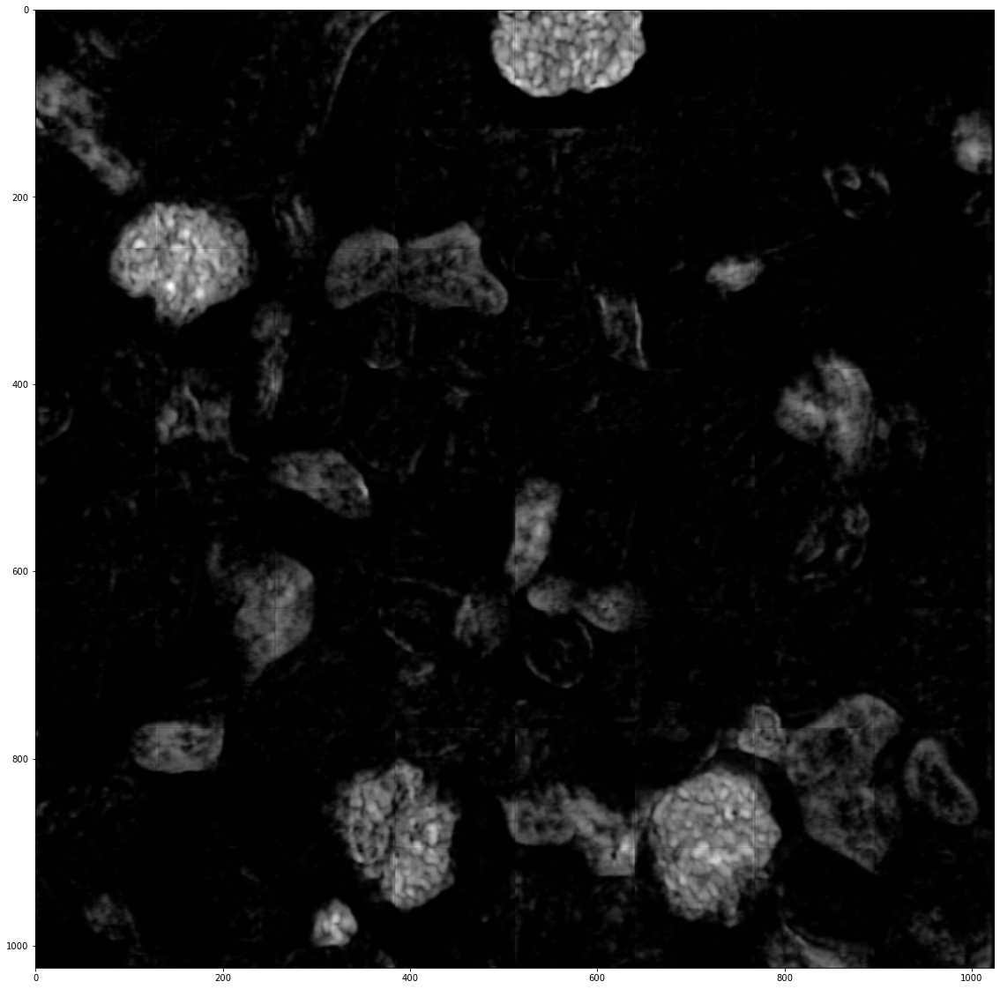

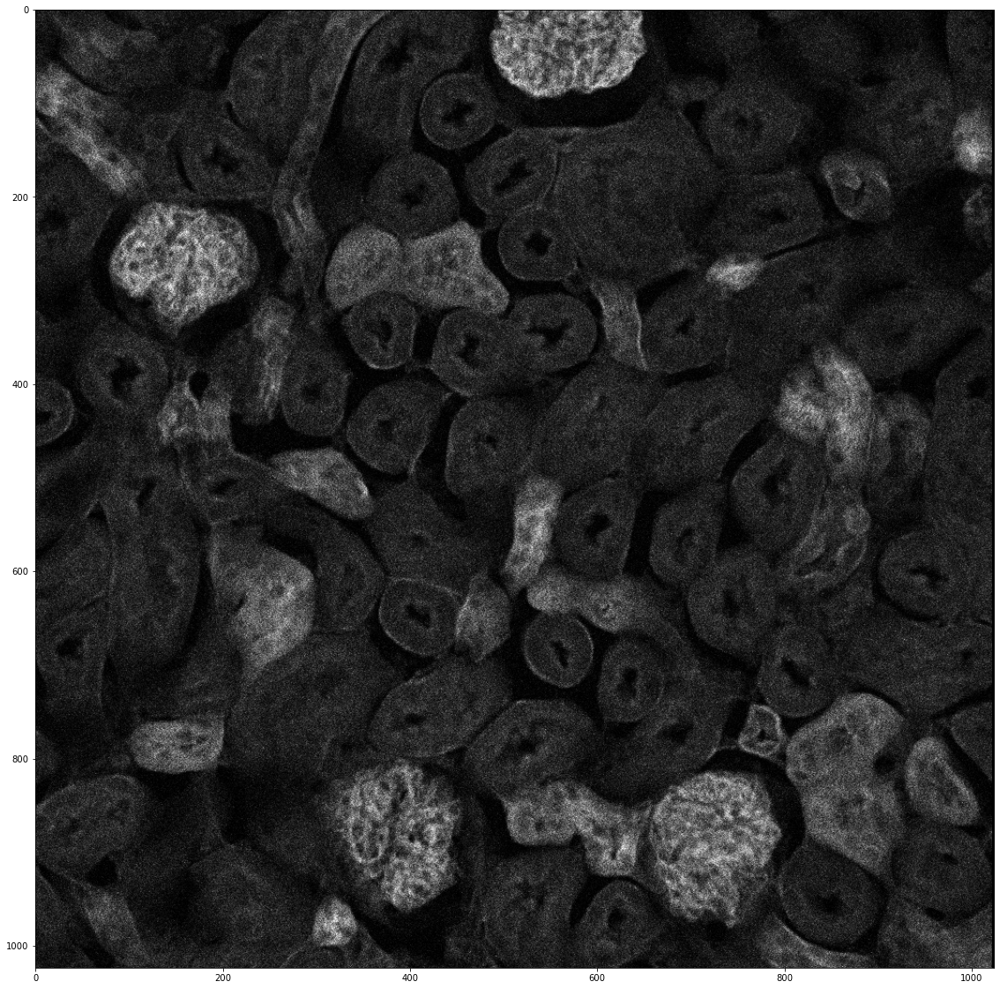

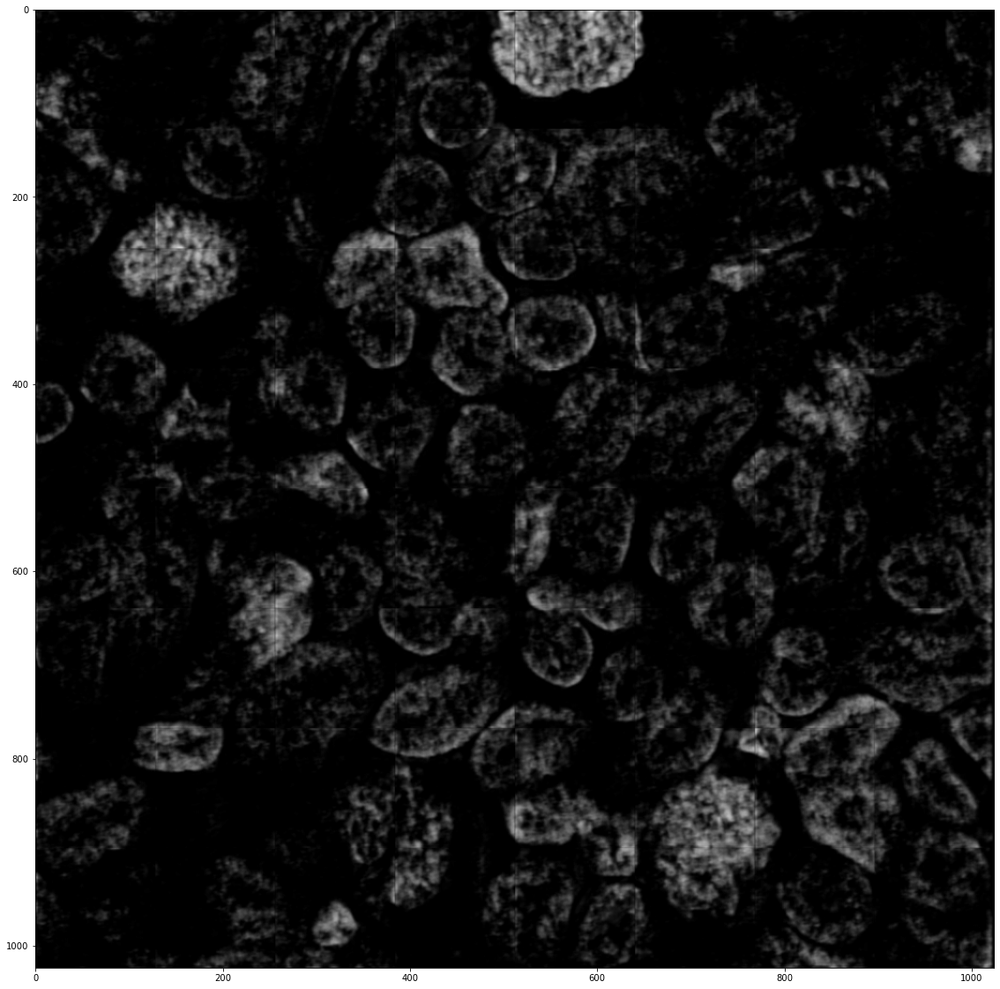

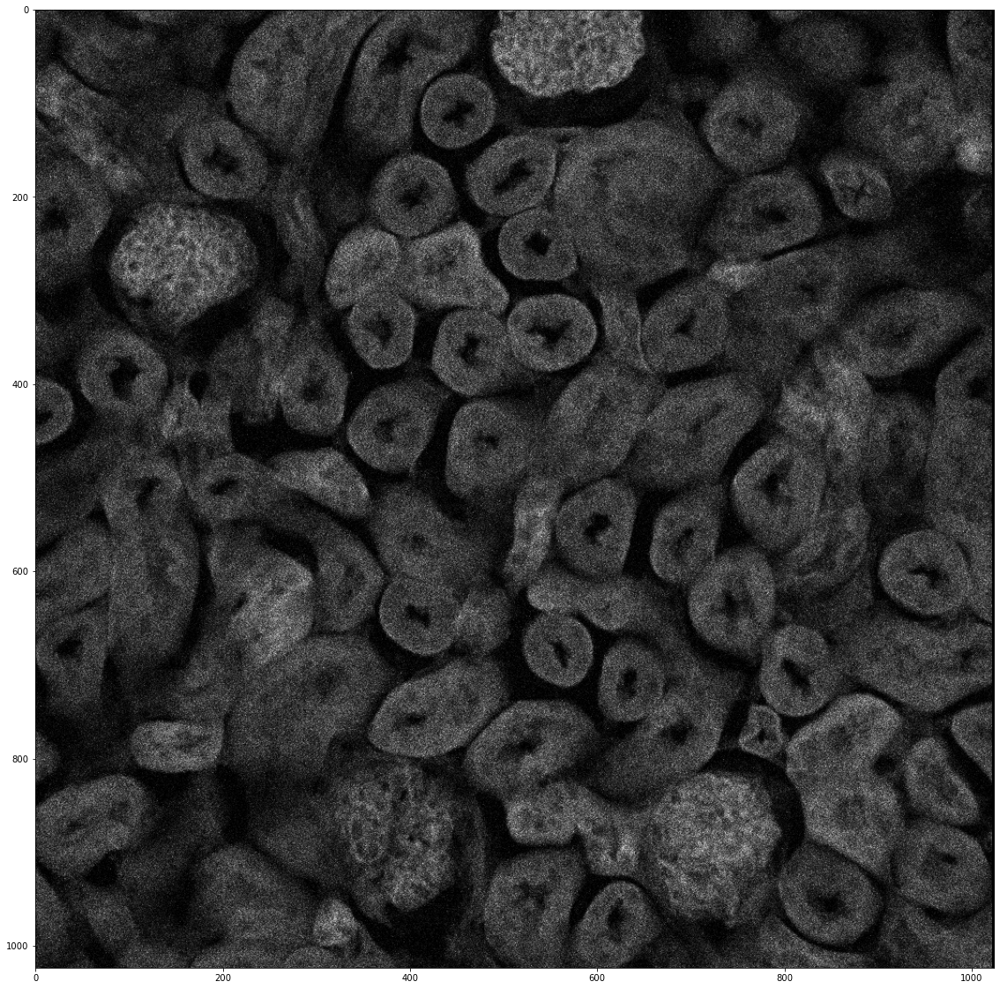

In [33]:
for i in range(2):
    plt.figure(figsize=(20,20))
    plt.imshow(imxtrec[i],cmap="gray")
    plt.figure(figsize=(20,20))
    plt.imshow(tiff.imread("02_20x_MolProbes-ReinsSouris-NLO900Interne.lsm")[i],cmap="gray")

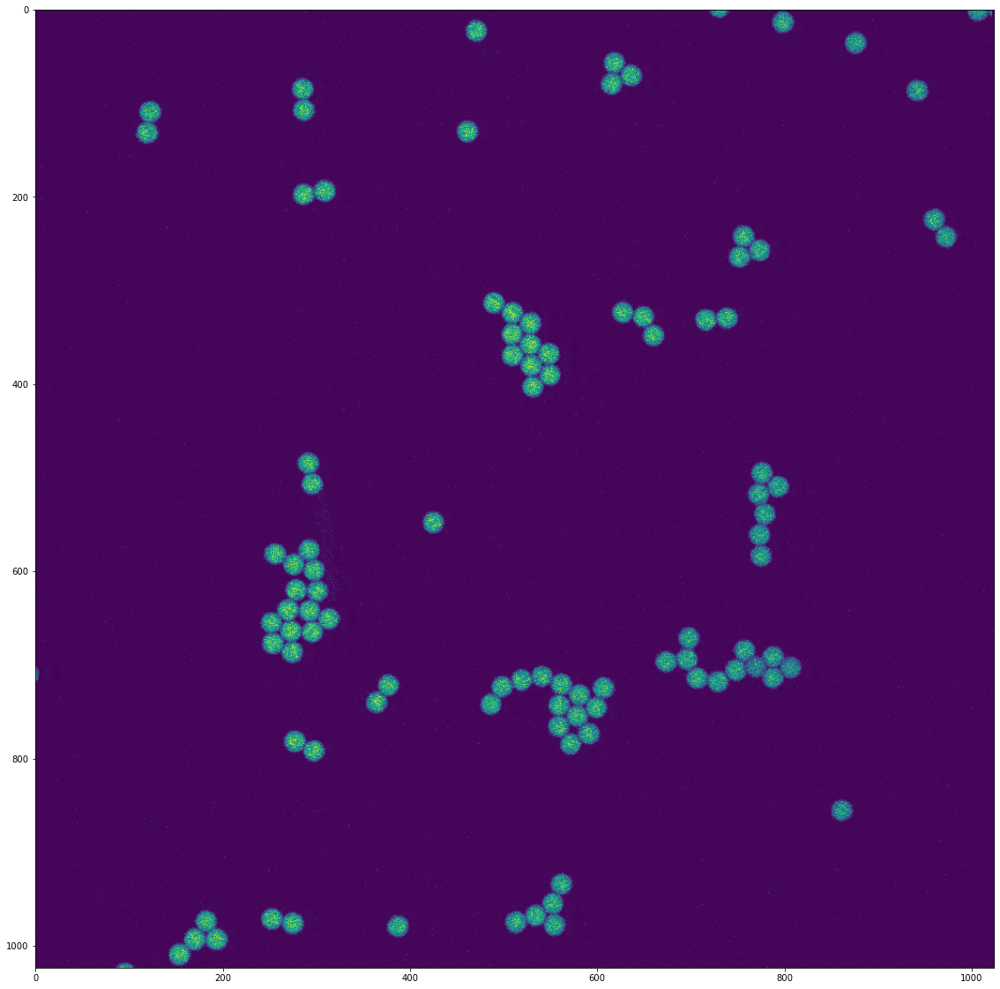

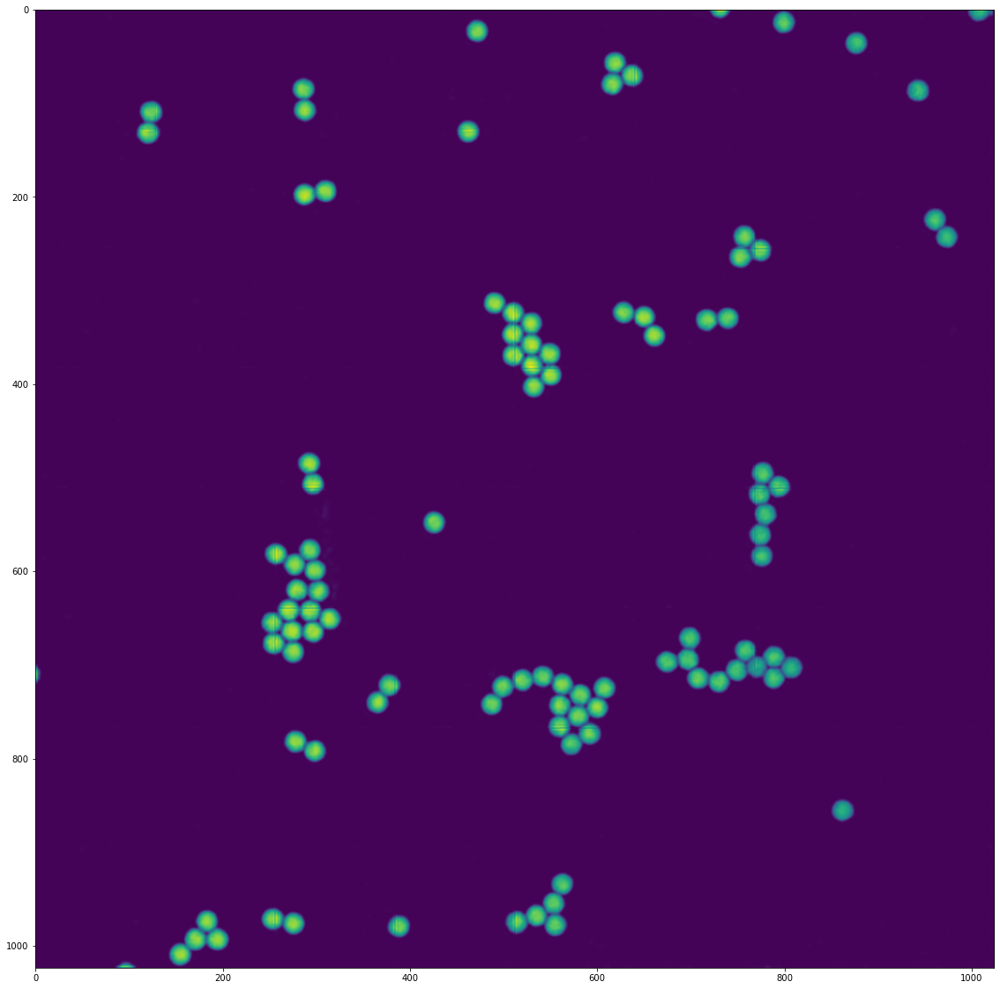

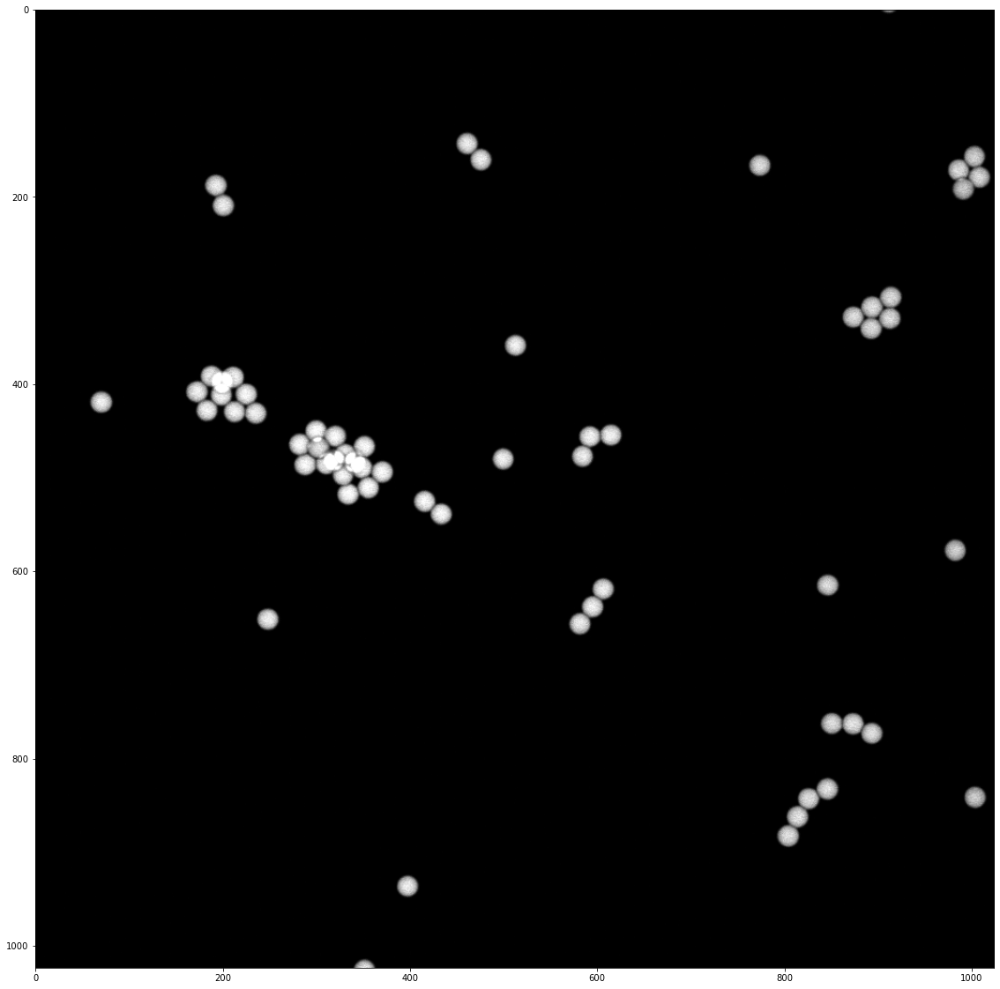

In [84]:
plt.figure(figsize=(20,20))
plt.imshow(x_test[0,...,0].astype("uint8"))
plt.figure(figsize=(20,20))
plt.imshow(xtrec[0])
plt.figure(figsize=(20,20))
plt.imshow(y_test[0].astype("uint8"),cmap="gray")

In [103]:
model.save("/content/gdrive/MyDrive/streetcare3")

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/streetcare3/assets


In [ ]:
model.compile(Adam(learning_rate=1e-5), loss=bce_jaccard_loss, metrics=[iou_score])
# Fit the model on the batches generated by datagen.flow().
history2 = model.fit(
    train_gen,
    epochs=100,
    validation_data=valid_gen,
    workers=2, use_multiprocessing=False,
    callbacks=es_callback)

In [13]:
load=True
if load:
    from tensorflow.keras.models import load_model
    model=load_model("streetcareb5_2",custom_objects={
      "mean_squared_error_loss": mse
    })

In [17]:
model.save("/content/gdrive/MyDrive/segmAughTile100+100")

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/segmAughTile100+100\assets


In [18]:
for h in [history1]:
    losscurve=h.history["loss"]
    plt.figure()
    plt.plot(losscurve[-20:])
    plt.show()

NameError: name 'history1' is not defined

In [ ]:
testim=tiff.imread("gdrive/MyDrive/testing.tif")
testlb=tiff.imread("gdrive/MyDrive/testing_groundtruth.tif")

In [ ]:
from segmentation_models import get_preprocessing
timages,tmasks=[],[]
for i in testim:timages.append(i)
for i in testlb:
    i[i!=0]=1
    tmasks.append(i)
del testim,testlb
gc.collect()
x_test=np.expand_dims(timages[:int(len(timages)/2)],-1)
y_test=np.expand_dims(tmasks[:int(len(tmasks)/2)],-1)
x_test=np.concatenate((x_test,x_test,x_test),axis=3)
x_test,y_test=tiling(x_test),tiling(y_test)
print(np.shape(x_test),np.shape(y_test))
preprocess_input = get_preprocessing('efficientnetb0')
x_test = preprocess_input(x_test)

In [ ]:
model.evaluate(x_test.astype("float32"),y_test.astype("float32"))

In [ ]:
res=model.predict(x_test,batch_size=64)
for i in range(10):
    print("ground_truth",i)
    plt.figure()
    plt.imshow(x_test[i,...,0],cmap="gray")
    plt.imshow(y_test[i,...,0],cmap="ocean",alpha=.2)
    plt.figure()
    plt.imshow(x_test[i,...,0],cmap="gray")
    plt.imshow(res[i,...,0],alpha=.2,cmap="jet")
    plt.show()

In [ ]:
model.evaluate(x_val,y_val.astype("float32"))

In [ ]:
x_val=get_preprocessing("efficientnetb0")(x_val)
res=model.predict(x_val,batch_size=64)

In [ ]:
tinfo=Tile(np.zeros(np.shape(np.expand_dims(timages[0],-1))),tilesize,overlap)
xtrec=[]
tinfo.pIm=tinfo.padding()
nim=tinfo.nbt[0]*tinfo.nbt[1]
for i in range(len(res)//nim):
    xtrec.append(tinfo.reconstruct(res[nim*i:nim*(i+1)]))
print(np.shape(xtrec))
print(np.max(xtrec))

In [ ]:
for i in range(3):
    print("ground_truth",i)
    plt.imshow(np.random.permutation(xtrec)[i],cmap="gray")
    plt.show()

In [ ]:
res_=np.copy(res).squeeze(axis=3)
score=0

res_[res_>.5]=1
res_[res_<=.5]=0
for i in range(res_.shape[0]):
  score+=js(res_[i].flatten(),y_val[i].squeeze().flatten())
print(score/len(res_))

In [ ]:
import scipy as sp

In [ ]:
def flip_lr(images):
    return np.flip(images, axis=2)

def shift(images, shift, axis):
    return np.roll(images, shift, axis=axis)

def rotate(images, angle):
    return sp.ndimage.rotate(
        images, angle, axes=(1,2),
        reshape=False, mode='nearest')

In [ ]:
import gc
del Xtest,pred
gc.collect()

In [ ]:
pred= model.predict(Xtest,batch_size=8)/6

In [ ]:
flip = flip_lr(Xtest)
pred+= flip_lr(model.predict(flip,batch_size=8))/6
del flip
gc.collect()
shiftw0=shift(Xtest, -30, axis=2)
pred+=shift(model.predict(shiftw0,batch_size=8), 30,axis=2)/6
del shiftw0
gc.collect()
shiftw1=shift(Xtest,  30, axis=2)
pred+=shift(model.predict(shiftw1,batch_size=8),-30,axis=2)/6
del shiftw1
gc.collect()
shifth0=shift(Xtest, -30, axis=1)
pred+=shift(model.predict(shifth0,batch_size=8), 30,axis=1)/6
del shifth0
gc.collect()
shifth1=shift(Xtest,  30, axis=1)
pred+=shift(model.predict(shifth1,batch_size=8),-30,axis=1)/6
del shifth1
gc.collect()
"""
rotate0 = rotate(Xtest, -10)
pred+= rotate(model.predict(rotate0,batch_size=8), 10)/8
del rotate0
gc.collect()
rotate1 = rotate(Xtest,  10)
pred+= rotate(model.predict(rotate1,batch_size=8),-10)/8
del rotate1
gc.collect()
"""

In [ ]:
for i in range(10):
  print("ground_truth",i)
  plt.figure()
  plt.imshow(ytest[i,...,0])
  plt.show()
  print("predict",i)
  plt.figure()
  plt.imshow(pred[i,...,0])
  plt.show()

In [ ]:
res_=np.copy(pred).squeeze(axis=3)
score=0

res_[res_>.5]=1
res_[res_<=.5]=0
for i in range(res_.shape[0]):
  score+=js(res_[i].flatten(),tmasks[i].flatten())
print(score/len(res_))